In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

from sklearn.linear_model import LogisticRegression
from sklearn.neighbors import KNeighborsClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn import tree
from sklearn.svm import SVC

from sklearn.model_selection import train_test_split
from sklearn.preprocessing import LabelEncoder
from sklearn.metrics import classification_report, confusion_matrix, accuracy_score, f1_score

from sklearn.model_selection import GridSearchCV, cross_val_score
from sklearn.feature_extraction.text import TfidfVectorizer

from collections import defaultdict

import re
import string
import time
import pickle
import warnings
from collections import Counter
warnings.filterwarnings('ignore')

Read configuration from FakeNewsModel.ini configuration file

In [2]:
import configparser

current_time = str(time.time())

config = configparser.ConfigParser()
config.read('FakeNewsModel.ini')
print(f'Configuration Sections: {config.sections()}')

file_true = config['DATASET']['TrueFile']
file_fake = config['DATASET']['FakeFile']

Proc_show_headinfo    = config['EDA']['SHOW_HeadInfo'    ]
Proc_showbasic_info   = config['EDA']['SHOW_BasicInfo'   ]
Proc_showmissing      = config['EDA']['SHOW_Missing'     ]
Proc_dropna           = config['EDA']['DROP_NAValues'    ]
Proc_showcommon_words = config['EDA']['SHOW_COMMON_WORDS']
Proc_show_wordcloud   = config['EDA']['SHOW_WORD_CLOUD'  ]

n_common_words  = (int)( config['EDA']['SHOW_n_COMMON_WORDS'])
print(f'n_common_words: {n_common_words}')

print(f'Proc_showbasic_info: {Proc_showbasic_info}, Proc_showmissing: {Proc_showmissing}, Proc_dropna: {Proc_dropna}')
print(f'Proc_showcommon_words: {Proc_showcommon_words}, Proc_show_wordcloud: {Proc_show_wordcloud}')

Configuration Sections: ['DATASET', 'FEATURE_PROCESSING', 'EDA', 'PROCESS', 'MODELS']
n_common_words: 50
Proc_showbasic_info: TRUE, Proc_showmissing: TRUE, Proc_dropna: TRUE
Proc_showcommon_words: TRUE, Proc_show_wordcloud: TRUE


In [3]:
# Text operation to remove escape characters
# Remove urls and escape characters
def wordopt( text ):
    text = text.lower()
    text = re.sub('\[.*?\]','',text)
    text = re.sub('\\W', ' ',  text)
    text = re.sub('https?://\S+|www\.\S+','',text)
    text = re.sub('<.*?>+','',text)
    text = re.sub('[%s]' % re.escape(string.punctuation),'',text)
    text = re.sub('\n','',text)
    text = re.sub('\w*\d\w*','',text)
    return text

In [4]:
# input the true and fake data files, 
# Extract 'publisher' info from the first 30 characters in the text
# Create new 'publisher' feature column

data_fake = pd.read_csv( file_fake )
data_true = pd.read_csv( file_true )

# Assigning Classes to the Dataset
data_fake['class'] = 0
data_true['class'] = 1

sysLog = [] 

# Custom function to split text
def split_text(text):
    if '-' in text[:30]:
        parts = text.split('-', 1)
        return parts[0], parts[1]
    else:
        return 'None', text
    
data_fake[['publisher', 'text']] = data_fake['text'].apply(lambda x: pd.Series(split_text(x)))
data_true[['publisher', 'text']] = data_true['text'].apply(lambda x: pd.Series(split_text(x)))



*****  Fake Data  *****
                                               title  \
0   Donald Trump Sends Out Embarrassing New Year’...   
1   Drunk Bragging Trump Staffer Started Russian ...   
2   Sheriff David Clarke Becomes An Internet Joke...   
3   Trump Is So Obsessed He Even Has Obama’s Name...   
4   Pope Francis Just Called Out Donald Trump Dur...   

                                                text subject  \
0  Donald Trump just couldn t wish all Americans ...    News   
1  House Intelligence Committee Chairman Devin Nu...    News   
2  On Friday, it was revealed that former Milwauk...    News   
3  On Christmas day, Donald Trump announced that ...    News   
4  Pope Francis used his annual Christmas Day mes...    News   

                date  class publisher  
0  December 31, 2017      0      None  
1  December 31, 2017      0      None  
2  December 30, 2017      0      None  
3  December 29, 2017      0      None  
4  December 25, 2017      0      None  



*****  True

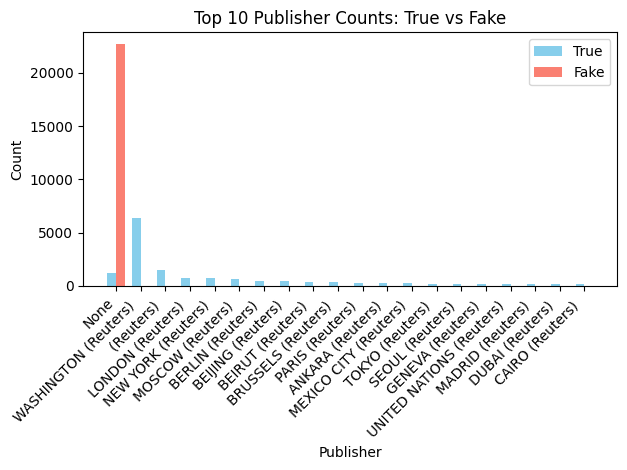

In [5]:
# Basic EDA on dataset
if Proc_show_headinfo: 
    print(f'*****  Fake Data  *****')
    print(f'{data_fake.head()}')
    print(f'\n\n')
    print(f'*****  True Data  *****')
    print(f'{data_true.head()}')
    
    # Group by the 'publisher' column and count occurrences
    publisher_counts_true = data_true.groupby('publisher').size().rename('true_count')
    publisher_counts_fake = data_fake.groupby('publisher').size().rename('fake_count')

    # Merge the counts into a single DataFrame
    publisher_counts = pd.concat([publisher_counts_true, publisher_counts_fake], axis=1).fillna(0)

    # Select the top 10 publishers based on the total counts
    publisher_counts['total_count'] = publisher_counts['true_count'] + publisher_counts['fake_count']
    top_publishers = publisher_counts.nlargest(20, 'total_count')

    # Create side-by-side bar plots
    x = np.arange(len(top_publishers.index))  # the label locations
    width = 0.35  # the width of the bars

    fig, ax = plt.subplots()
    bars1 = ax.bar(x - width/2, top_publishers['true_count'], width, label='True', color='skyblue')
    bars2 = ax.bar(x + width/2, top_publishers['fake_count'], width, label='Fake', color='salmon')

    # Add some text for labels, title and custom x-axis tick labels, etc.
    ax.set_xlabel('Publisher')
    ax.set_ylabel('Count')
    ax.set_title('Top 10 Publisher Counts: True vs Fake')
    ax.set_xticks(x)
    ax.set_xticklabels(top_publishers.index, rotation=45, ha='right')
    ax.legend()

    fig.tight_layout()
    plt.savefig('news_publisher.jpg')
    plt.show()

In [6]:
if Proc_showbasic_info:
    print(f'*****  DataSet Basic Info  *****')
    print(f'Fake Set: {data_fake.shape}')
    print(f'{data_fake.info()}')
    print(f'{data_fake.describe()}')
    
    print(f'True Set: {data_true.shape}')
    print(f'{data_true.info()}')
    print(f'{data_true.describe()}')
    
if Proc_showmissing:
    print(f'Fake News null: {data_fake.isnull().sum()}')
    print(f'True News null: {data_true.isnull().sum()}')


*****  DataSet Basic Info  *****
Fake Set: (23481, 6)
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 23481 entries, 0 to 23480
Data columns (total 6 columns):
 #   Column     Non-Null Count  Dtype 
---  ------     --------------  ----- 
 0   title      23481 non-null  object
 1   text       23481 non-null  object
 2   subject    23481 non-null  object
 3   date       23481 non-null  object
 4   class      23481 non-null  int64 
 5   publisher  23481 non-null  object
dtypes: int64(1), object(5)
memory usage: 1.1+ MB
None
         class
count  23481.0
mean       0.0
std        0.0
min        0.0
25%        0.0
50%        0.0
75%        0.0
max        0.0
True Set: (21417, 6)
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 21417 entries, 0 to 21416
Data columns (total 6 columns):
 #   Column     Non-Null Count  Dtype 
---  ------     --------------  ----- 
 0   title      21417 non-null  object
 1   text       21417 non-null  object
 2   subject    21417 non-null  object
 3   date   

[nltk_data] Downloading package stopwords to
[nltk_data]     C:\Users\fkao9\AppData\Roaming\nltk_data...
[nltk_data]   Package stopwords is already up-to-date!
[nltk_data] Downloading package punkt to
[nltk_data]     C:\Users\fkao9\AppData\Roaming\nltk_data...
[nltk_data]   Package punkt is already up-to-date!
[nltk_data] Downloading package averaged_perceptron_tagger_eng to
[nltk_data]     C:\Users\fkao9\AppData\Roaming\nltk_data...
[nltk_data]   Package averaged_perceptron_tagger_eng is already up-to-
[nltk_data]       date!
[nltk_data] Downloading package wordnet to
[nltk_data]     C:\Users\fkao9\AppData\Roaming\nltk_data...
[nltk_data]   Package wordnet is already up-to-date!


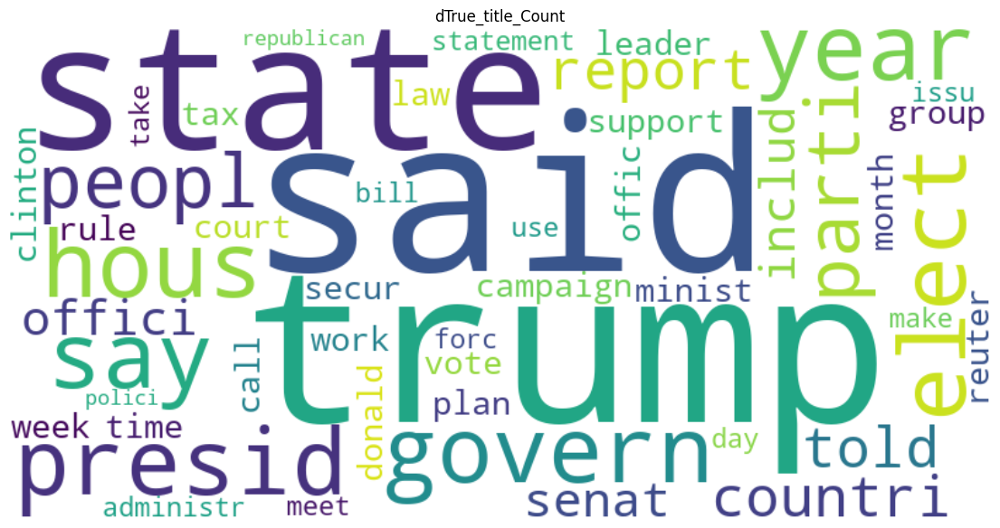

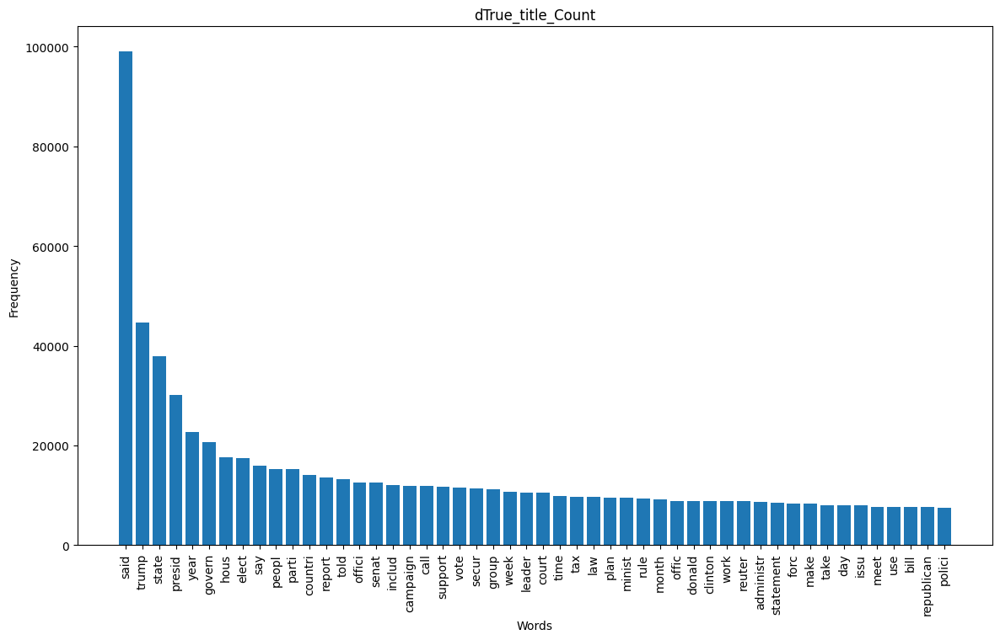

... WordCloud ...


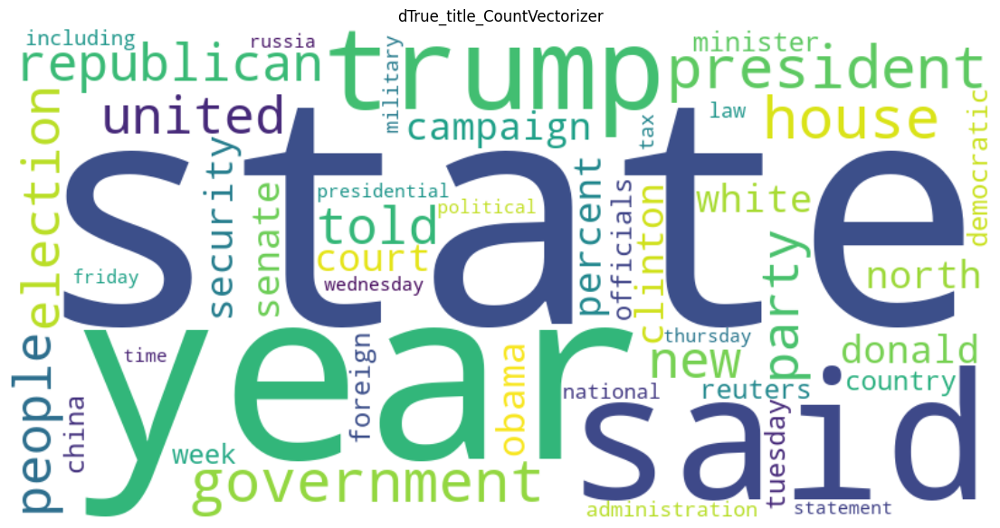

... FreqBar ...


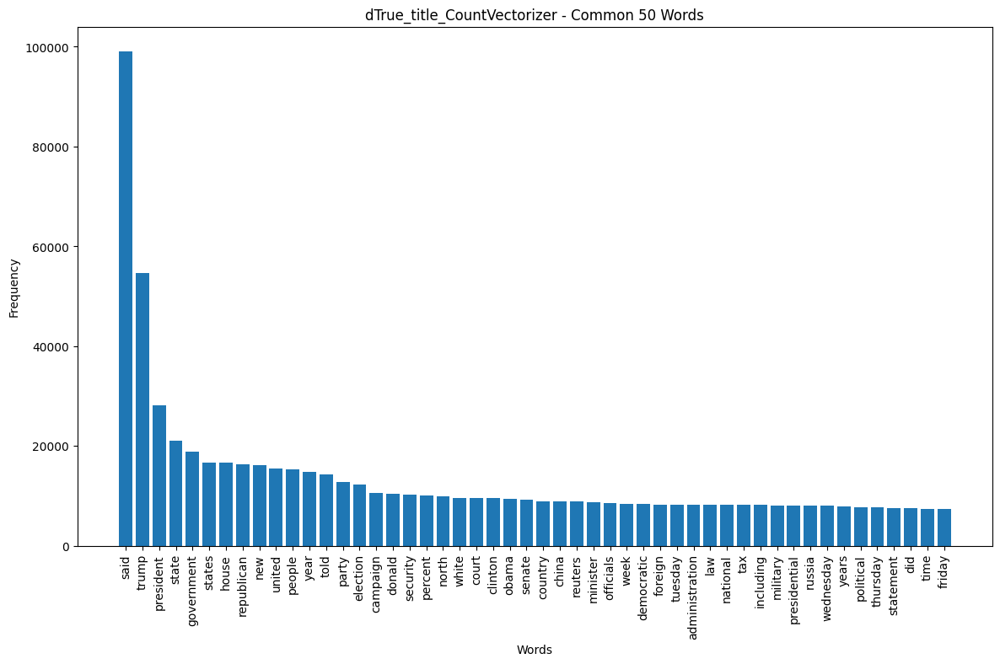

... FreqPie ...


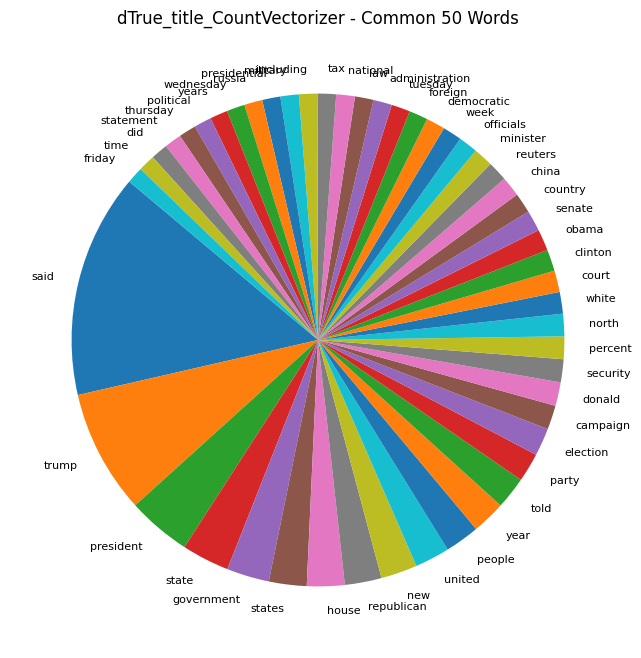

... Treemap ...


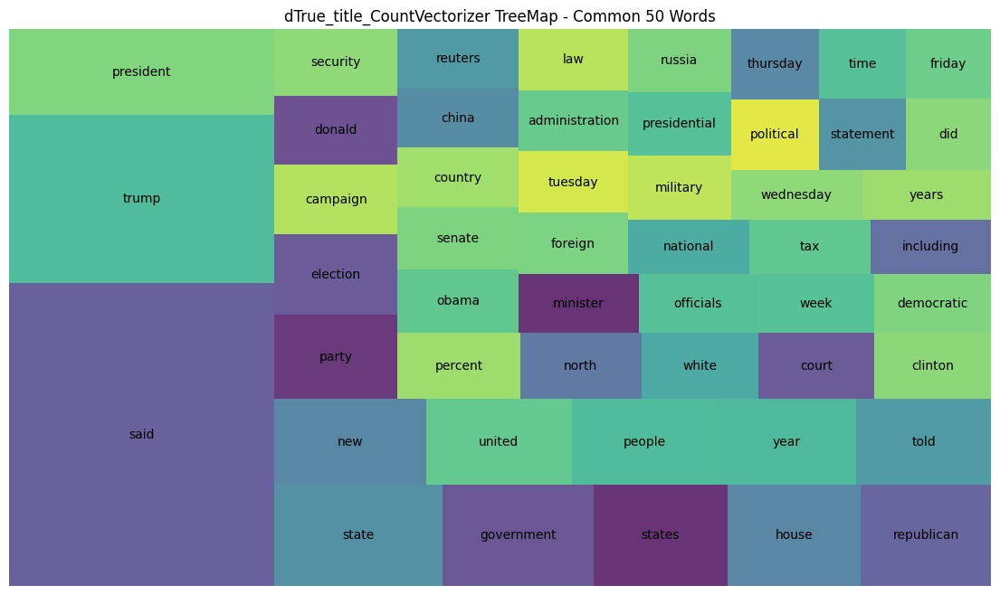

... CircularPacking ...


... FreqRadialBar ...


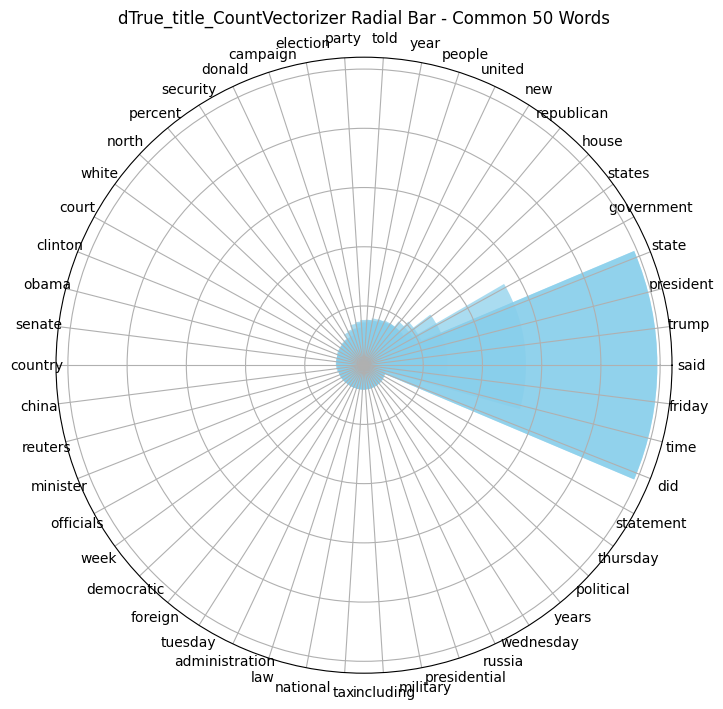

... WordCloud ...


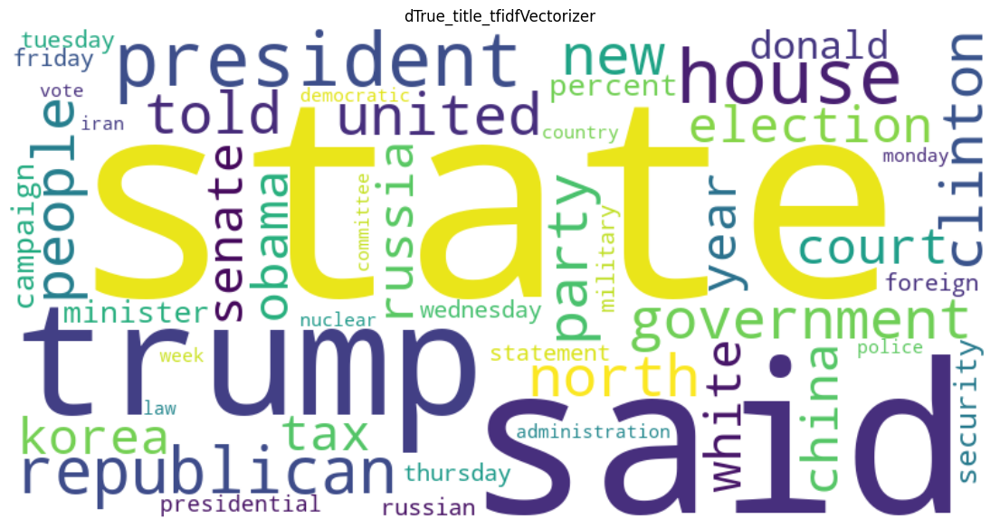

... FreqBar ...


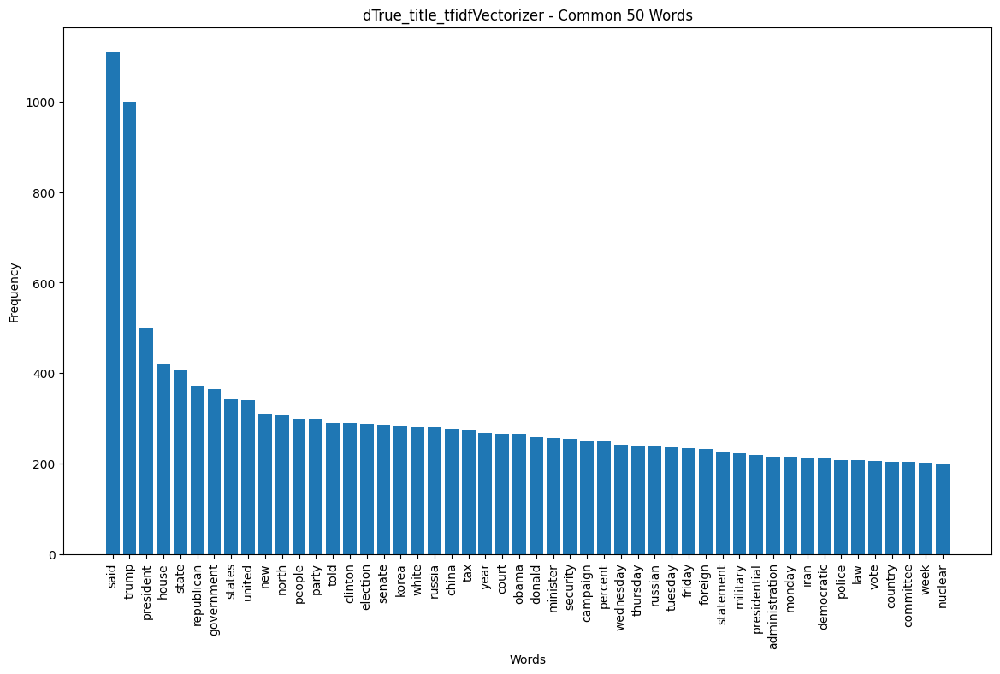

... FreqPie ...


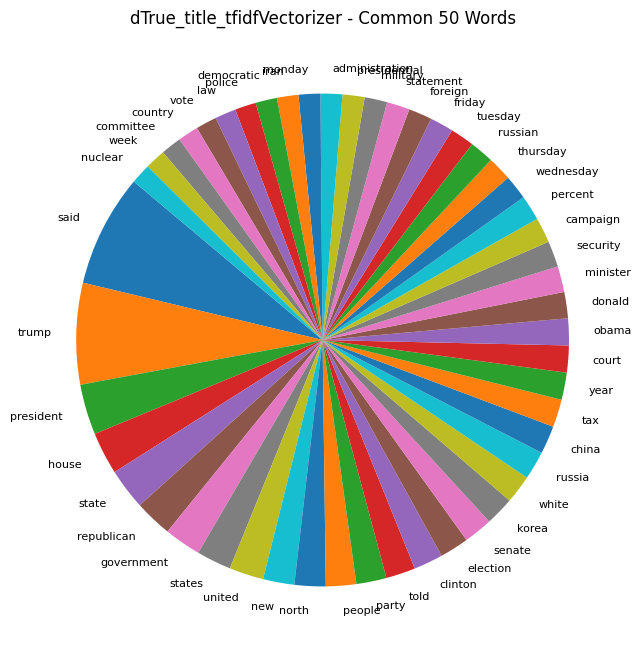

... Treemap ...


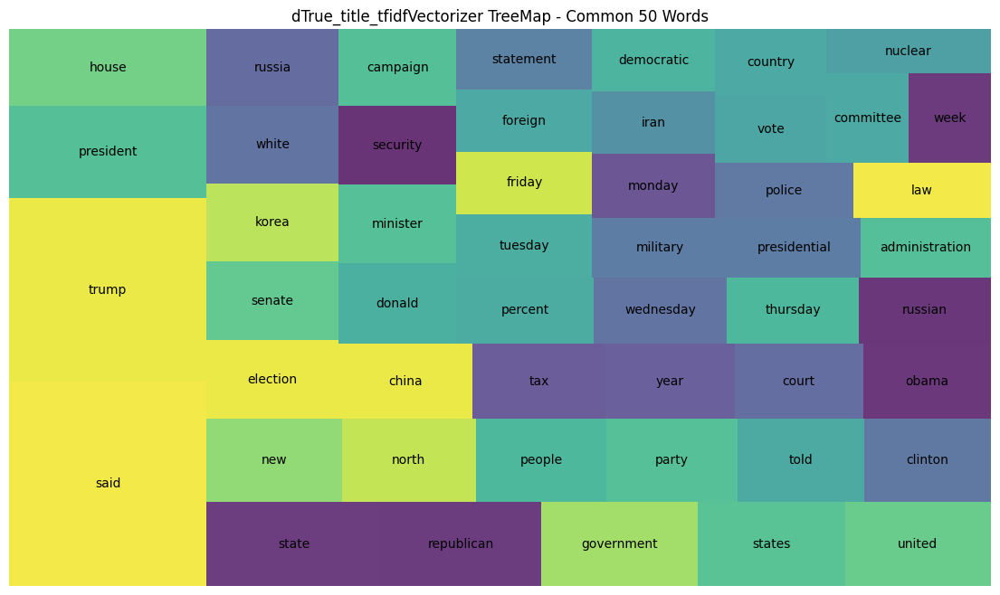

... CircularPacking ...


... FreqRadialBar ...


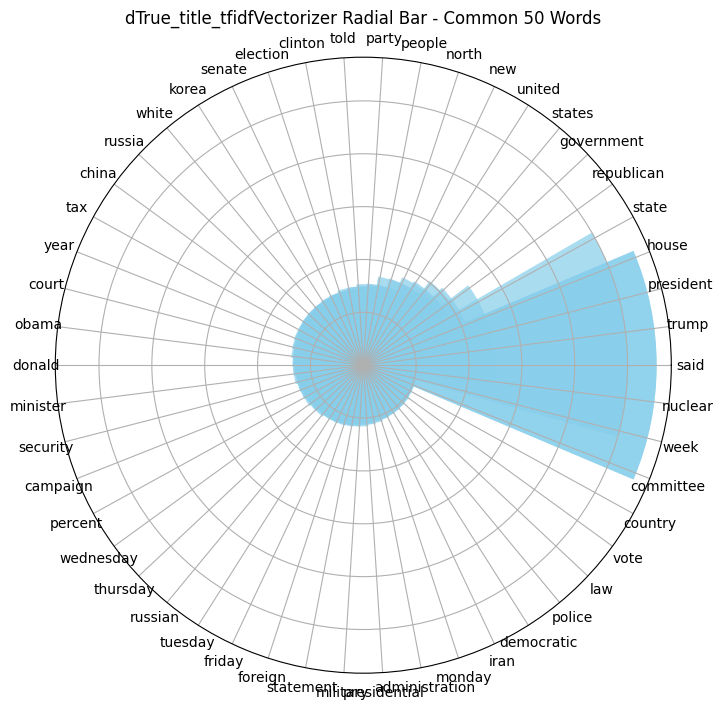

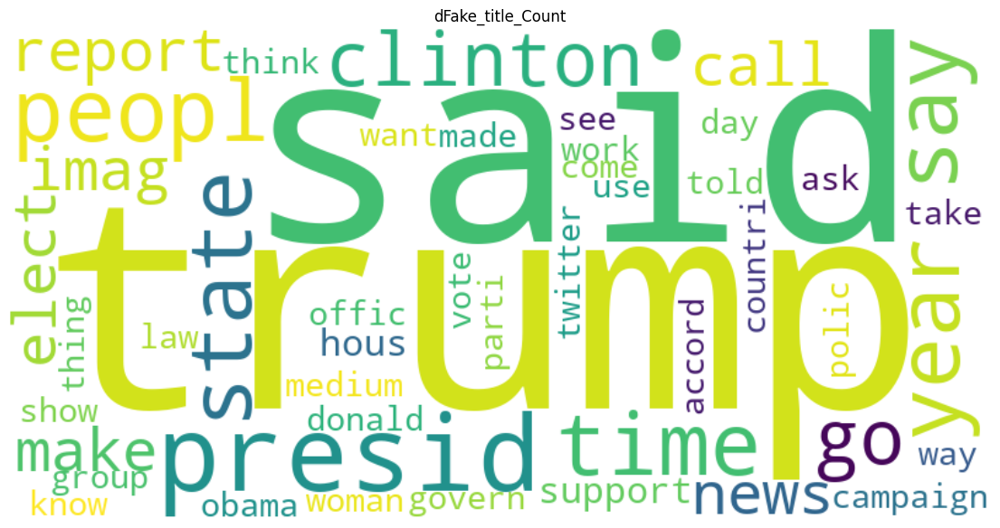

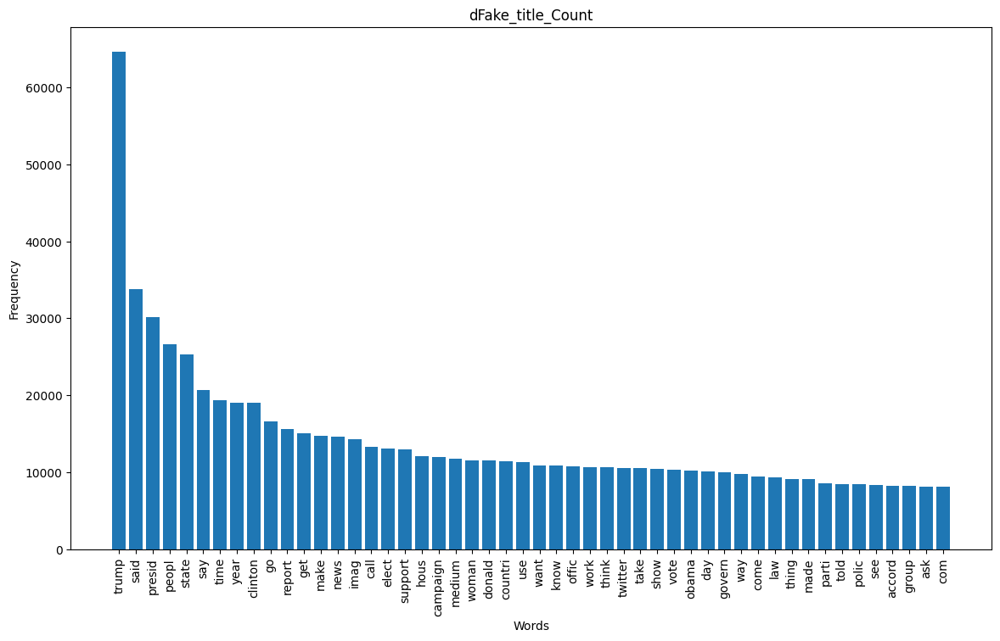

... WordCloud ...


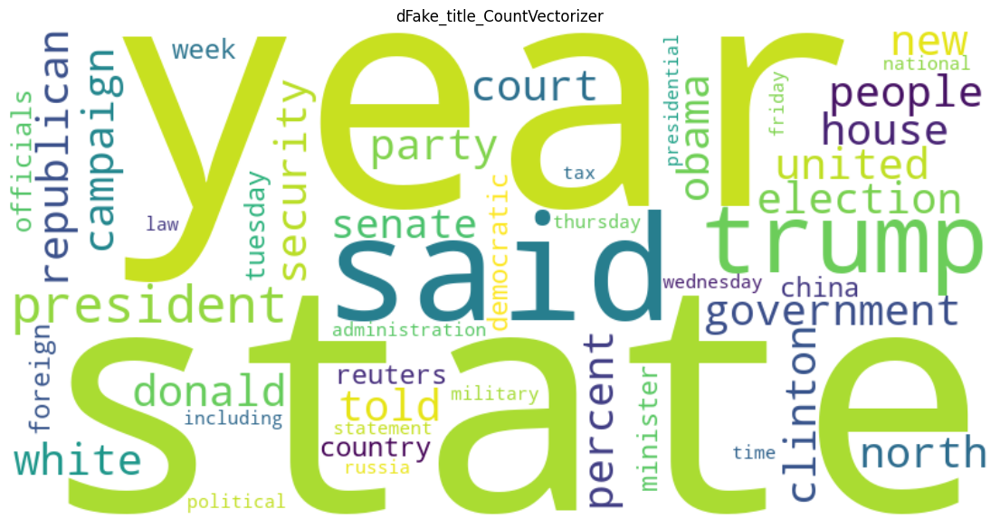

... FreqBar ...


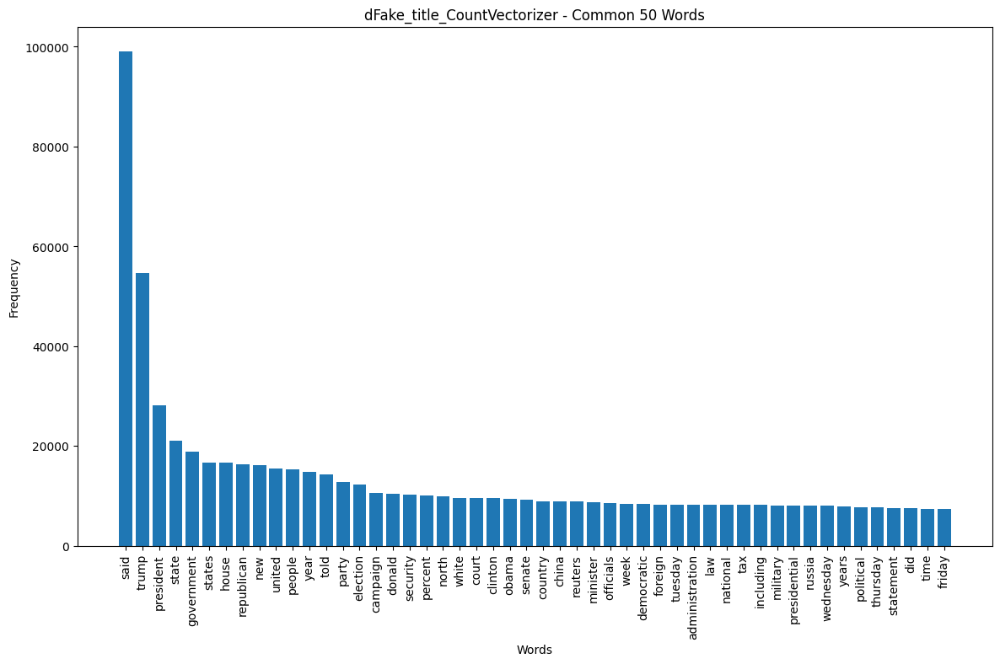

... FreqPie ...


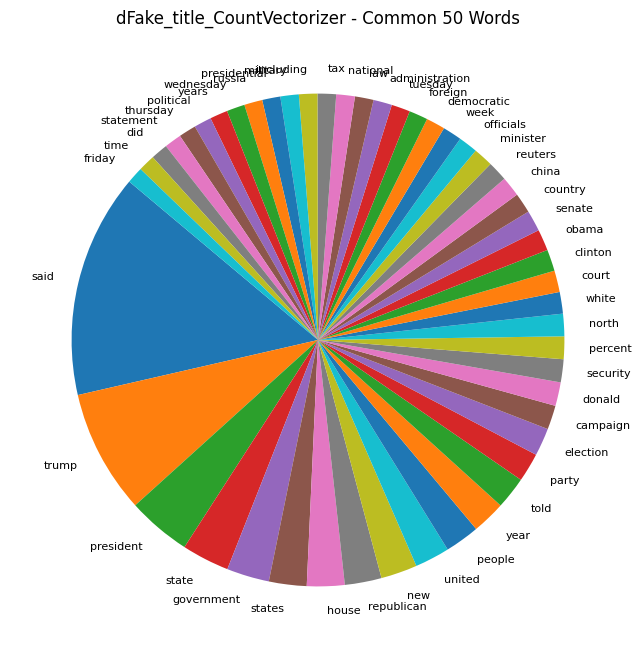

... Treemap ...


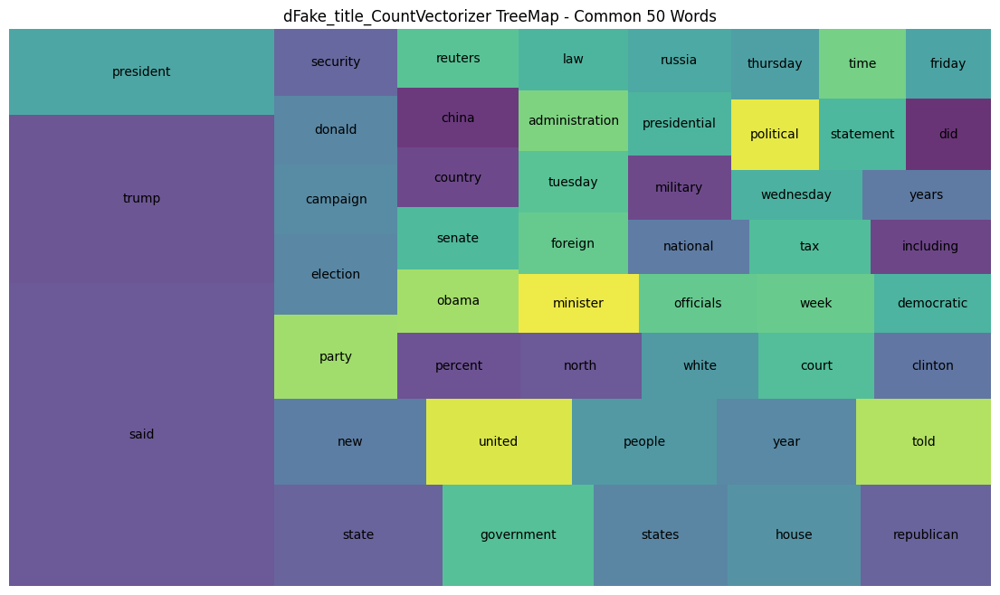

... CircularPacking ...


... FreqRadialBar ...


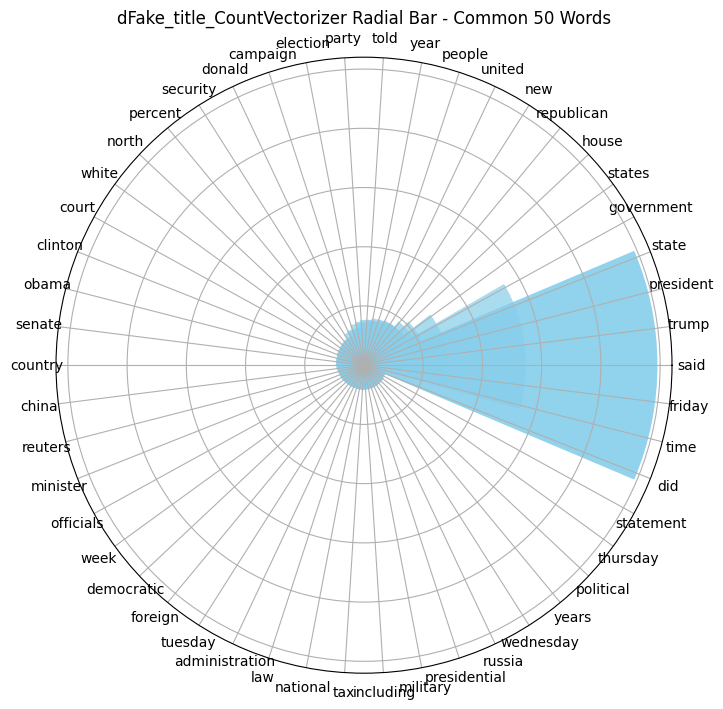

... WordCloud ...


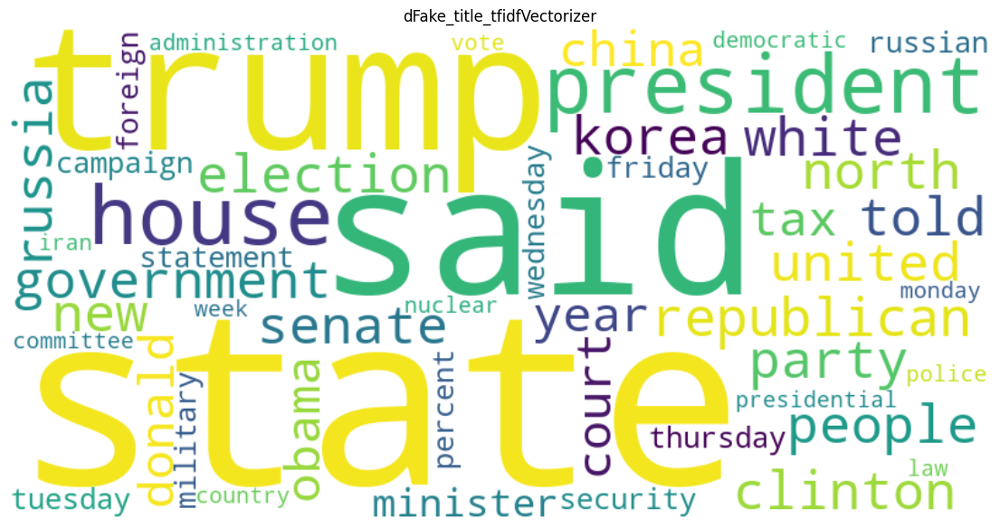

... FreqBar ...


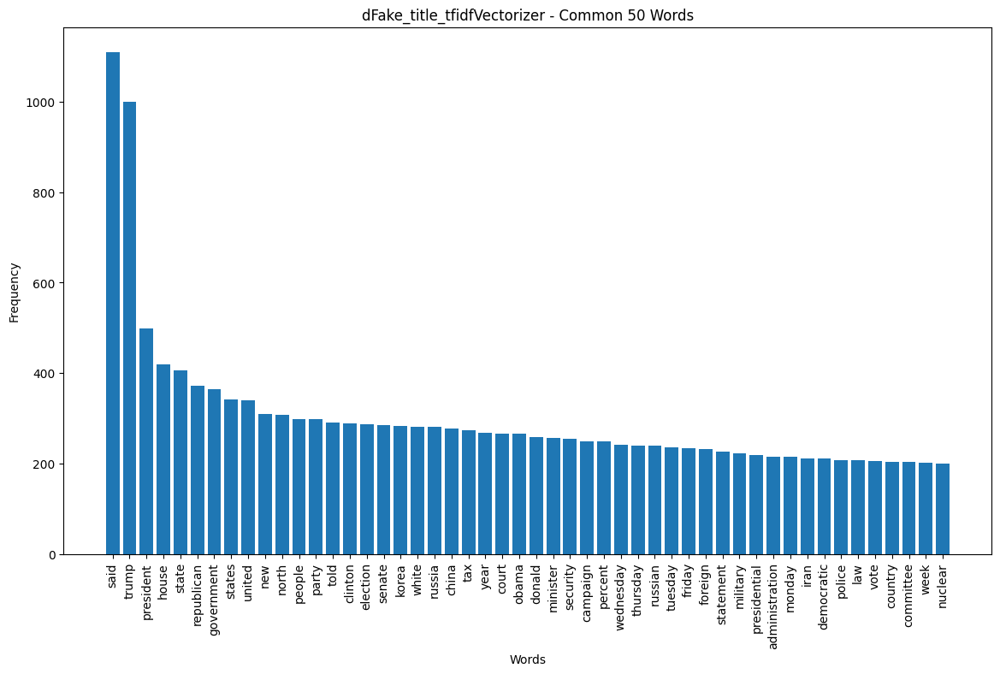

... FreqPie ...


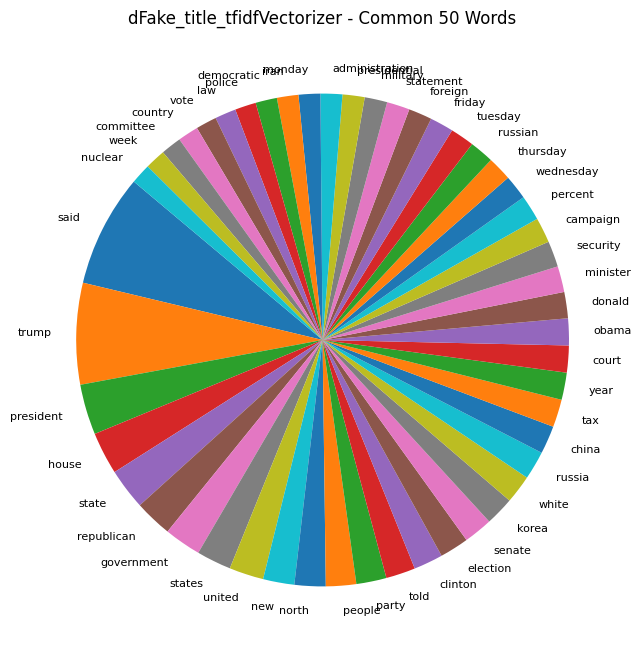

... Treemap ...


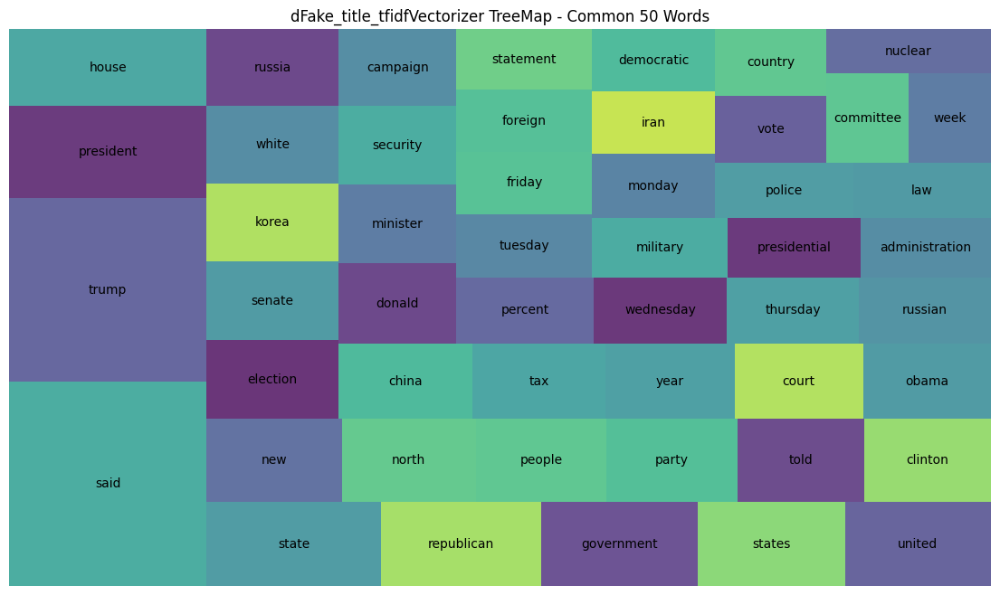

... CircularPacking ...


... FreqRadialBar ...


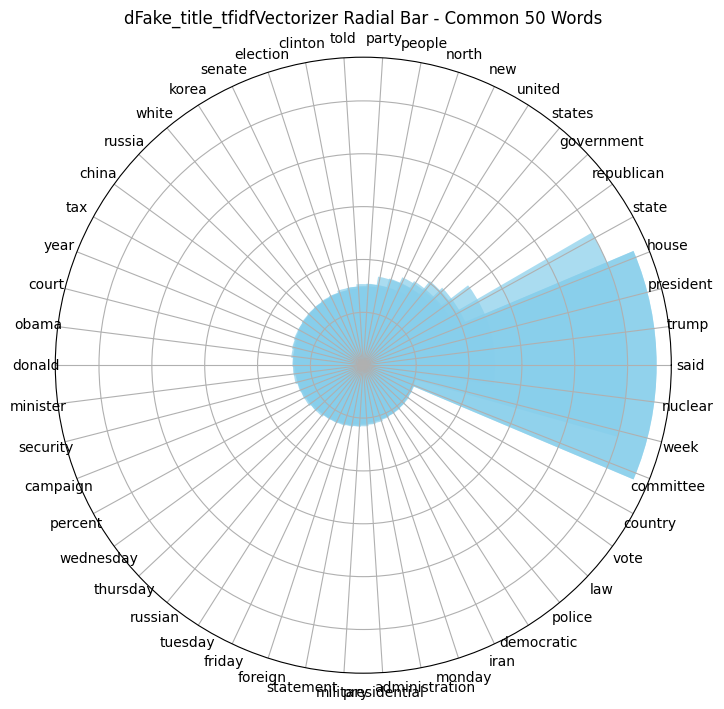

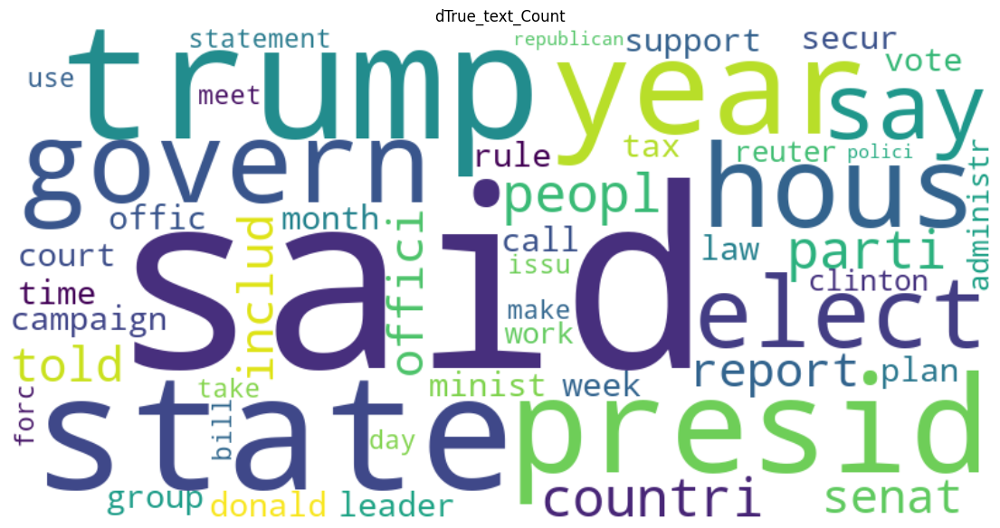

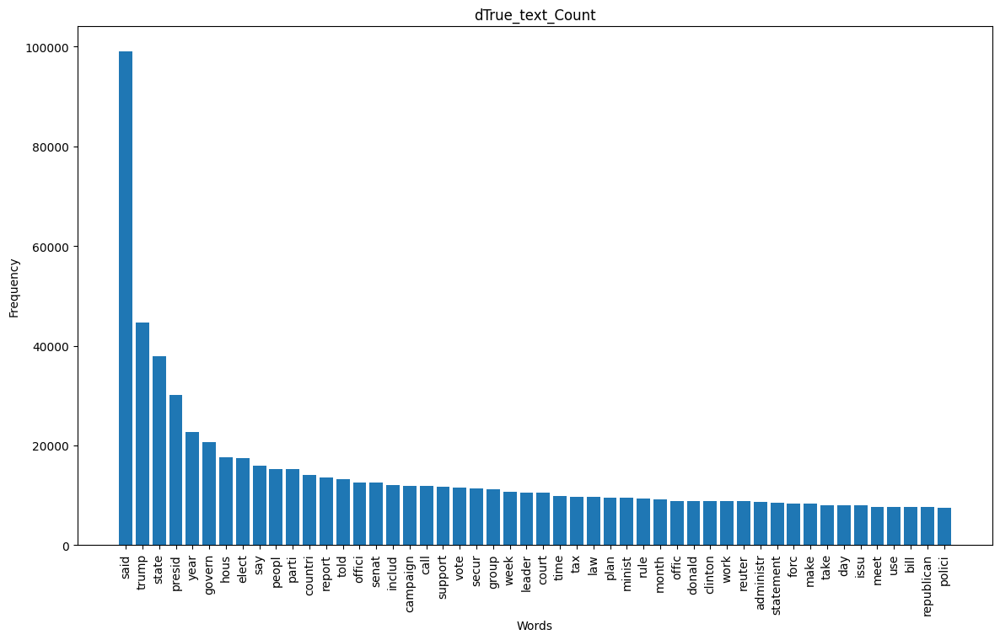

... WordCloud ...


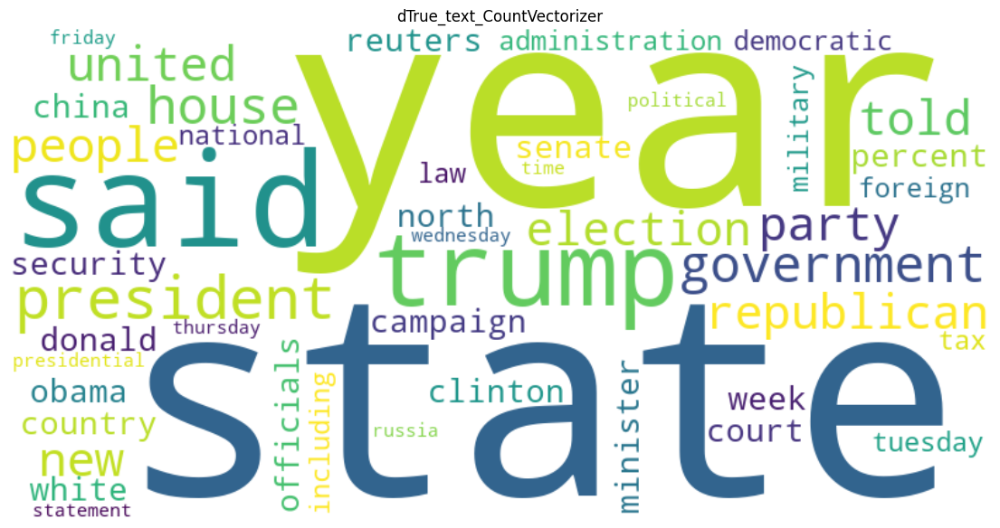

... FreqBar ...


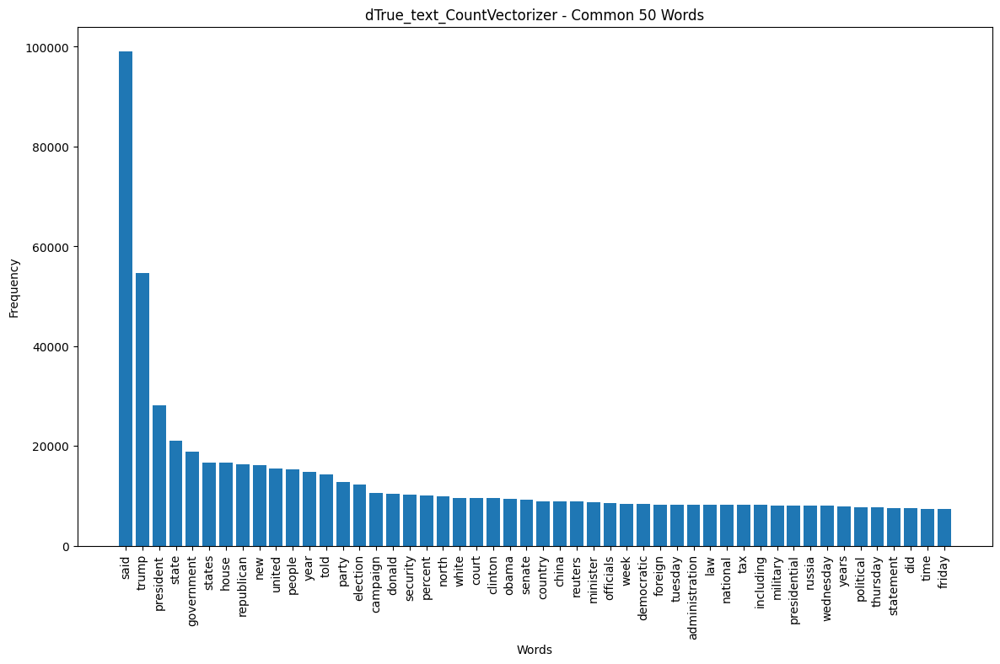

... FreqPie ...


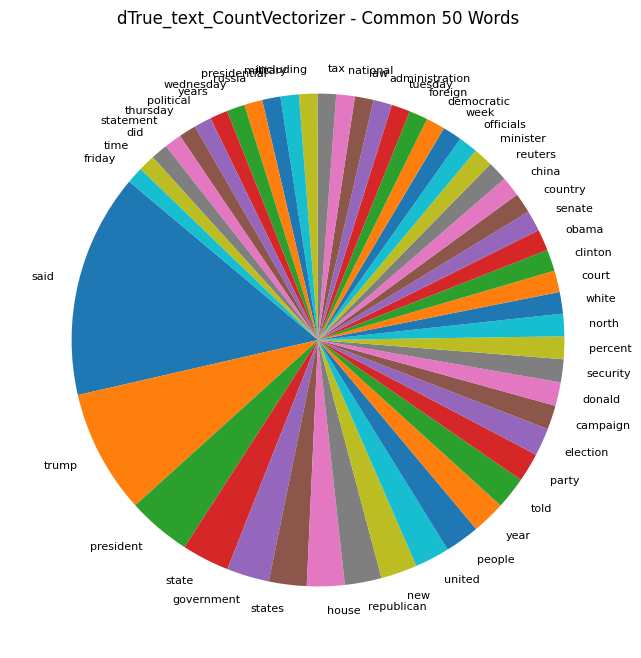

... Treemap ...


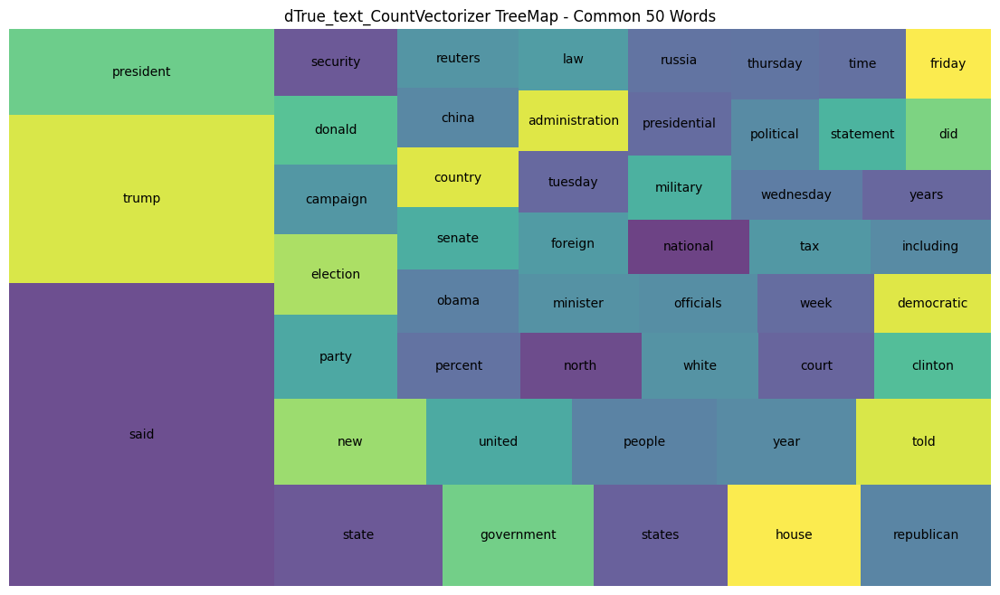

... CircularPacking ...


... FreqRadialBar ...


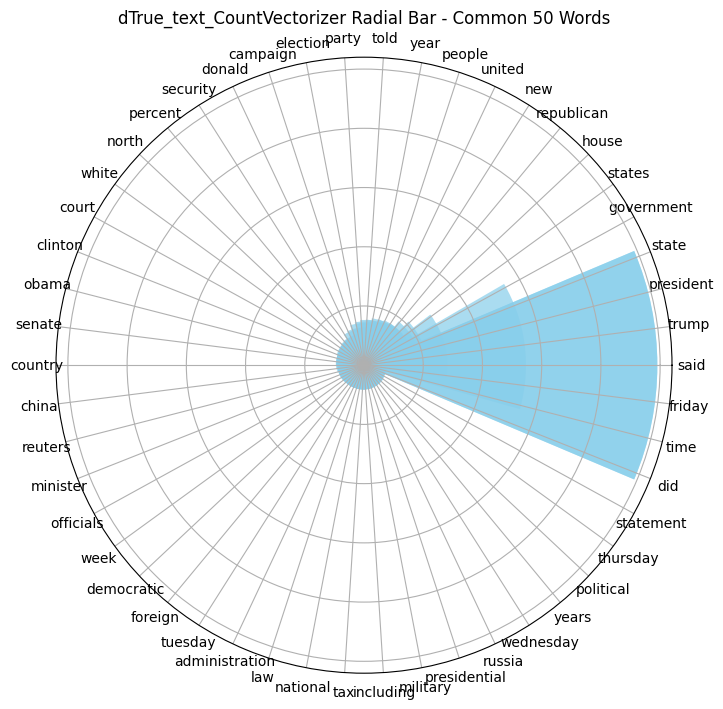

... WordCloud ...


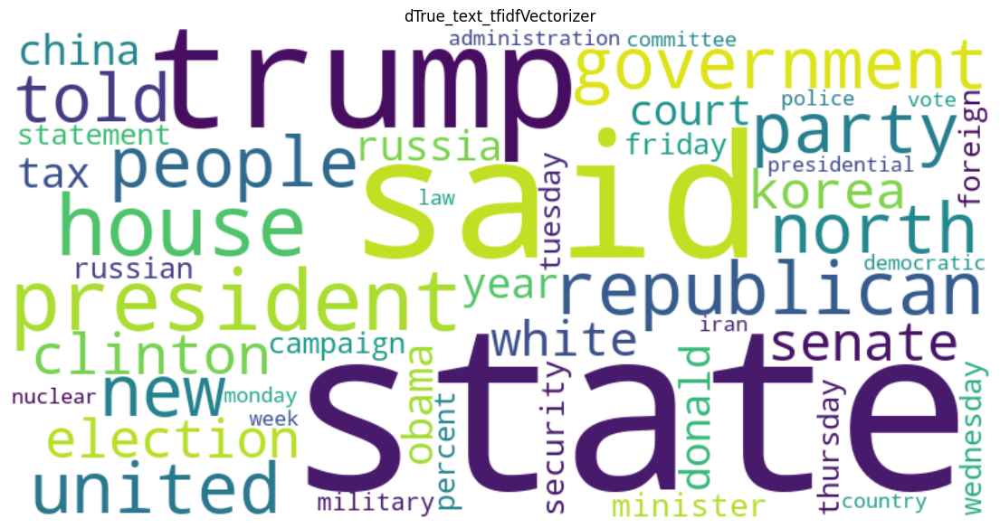

... FreqBar ...


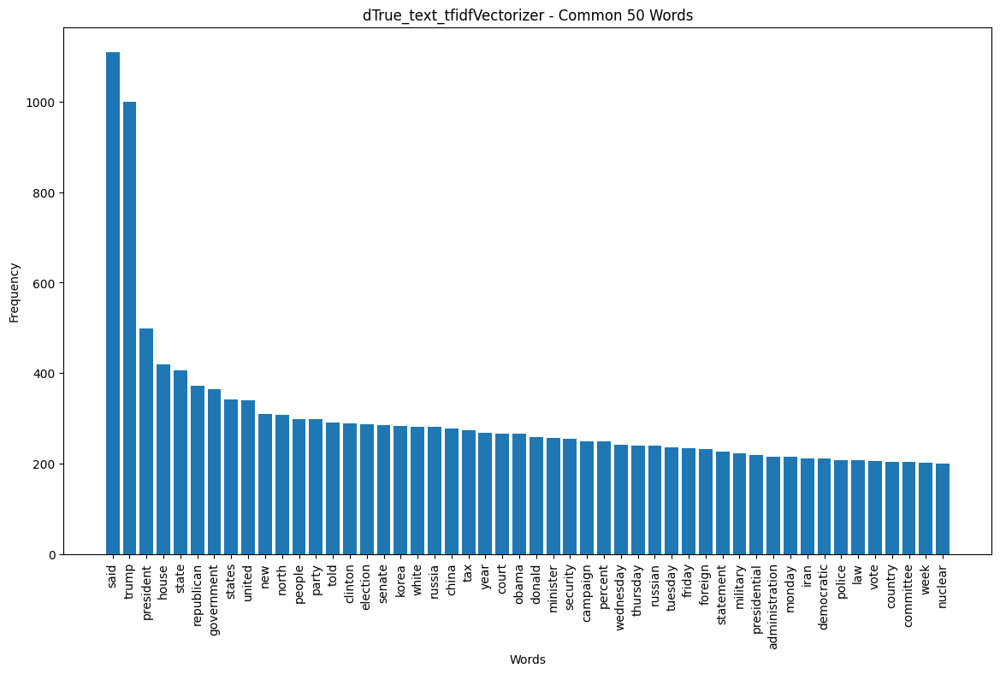

... FreqPie ...


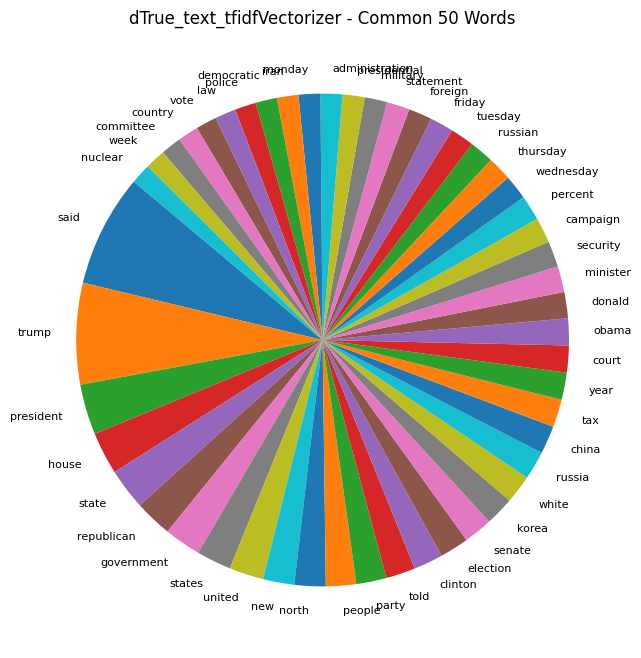

... Treemap ...


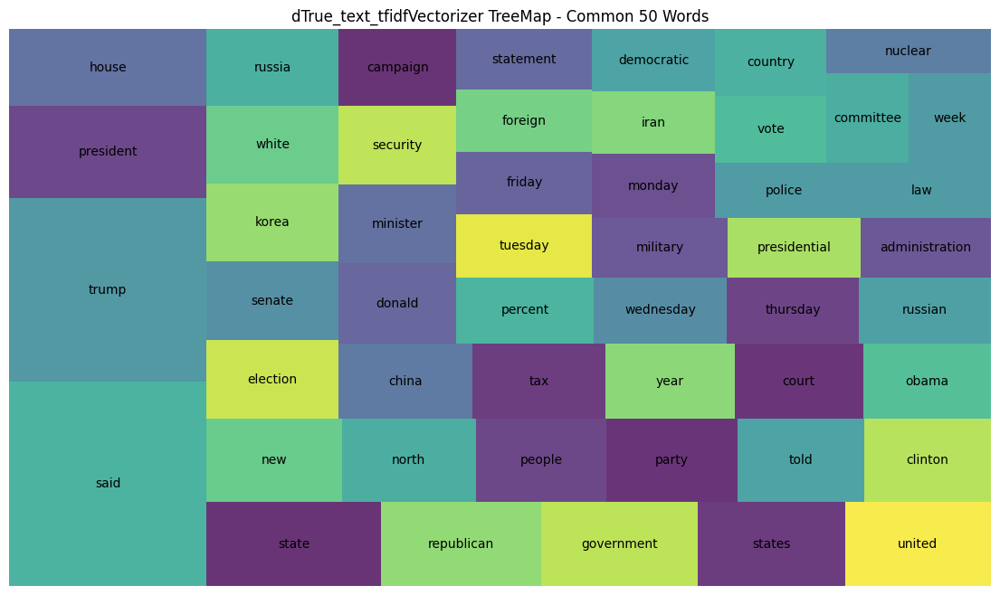

... CircularPacking ...


... FreqRadialBar ...


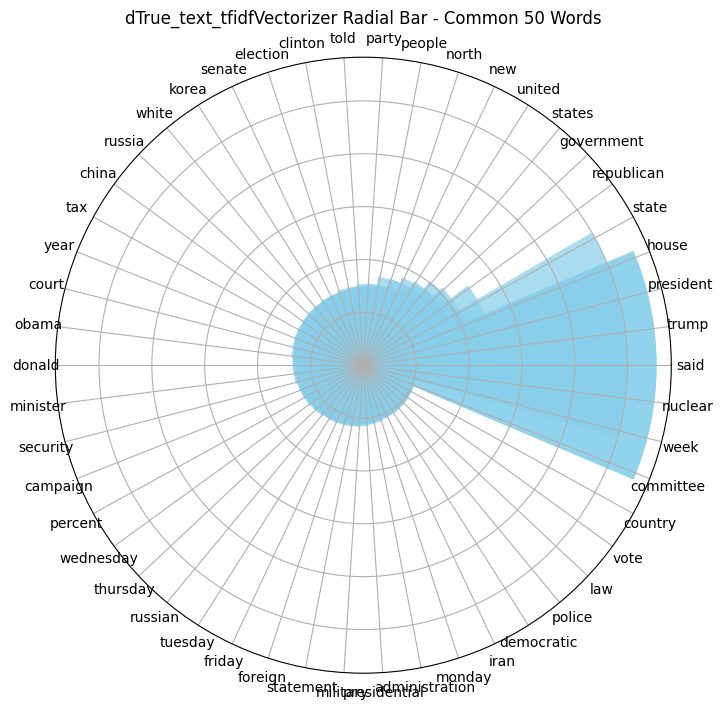

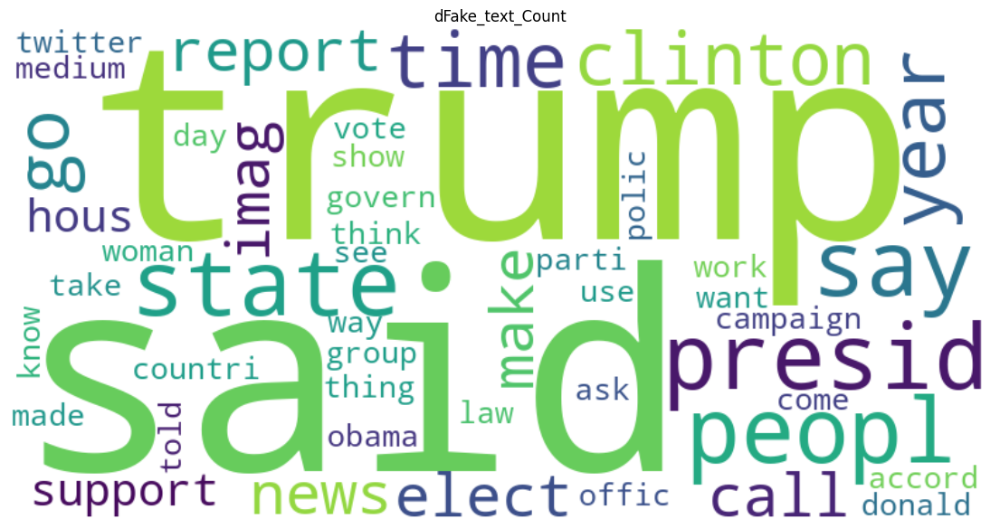

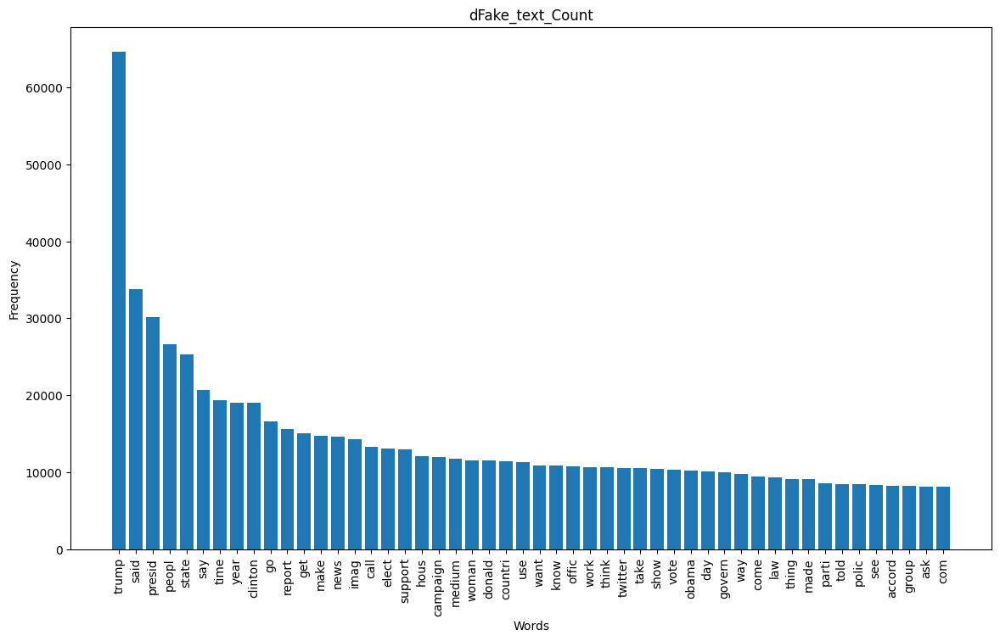

... WordCloud ...


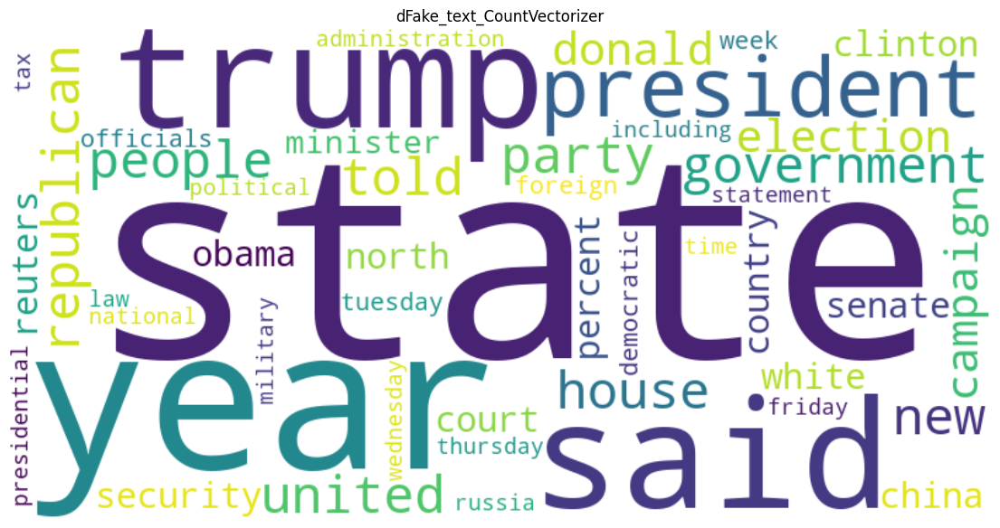

... FreqBar ...


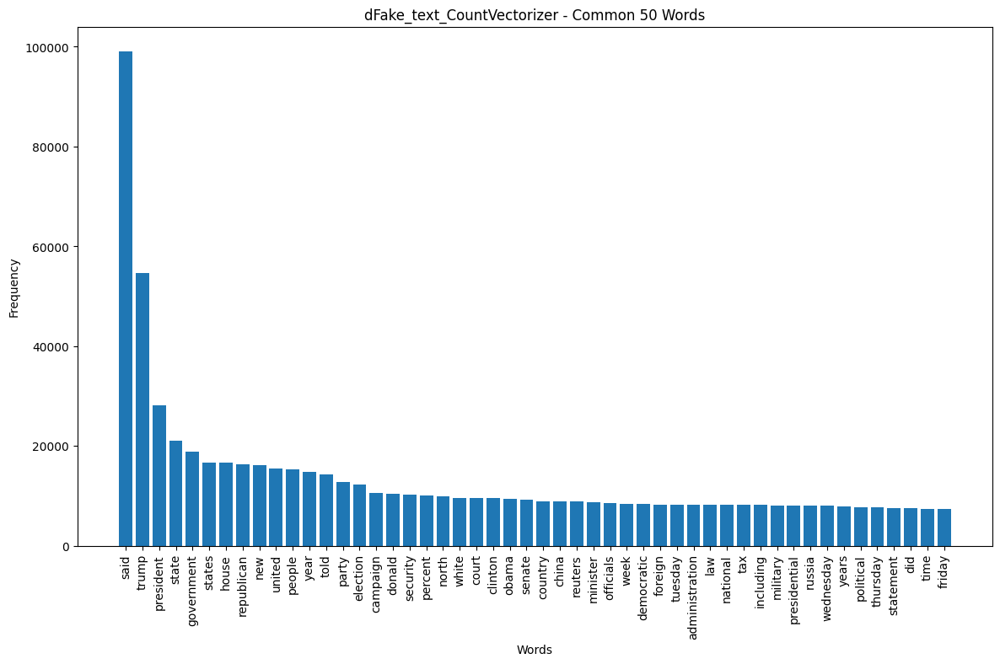

... FreqPie ...


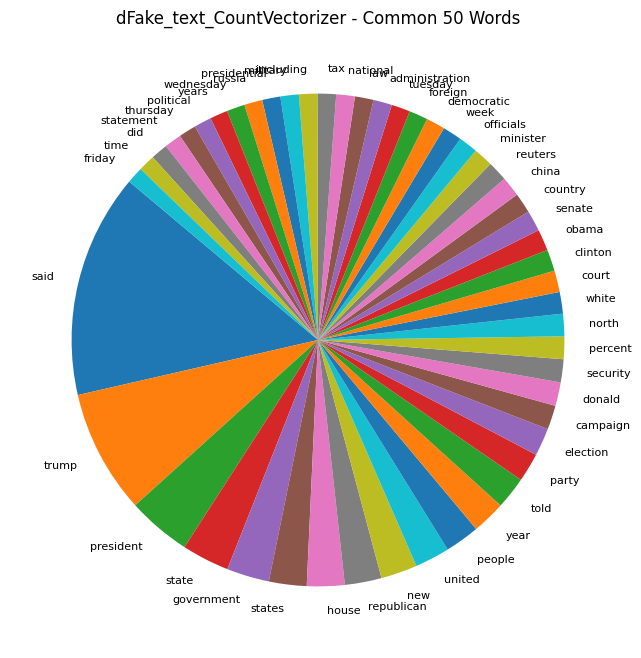

... Treemap ...


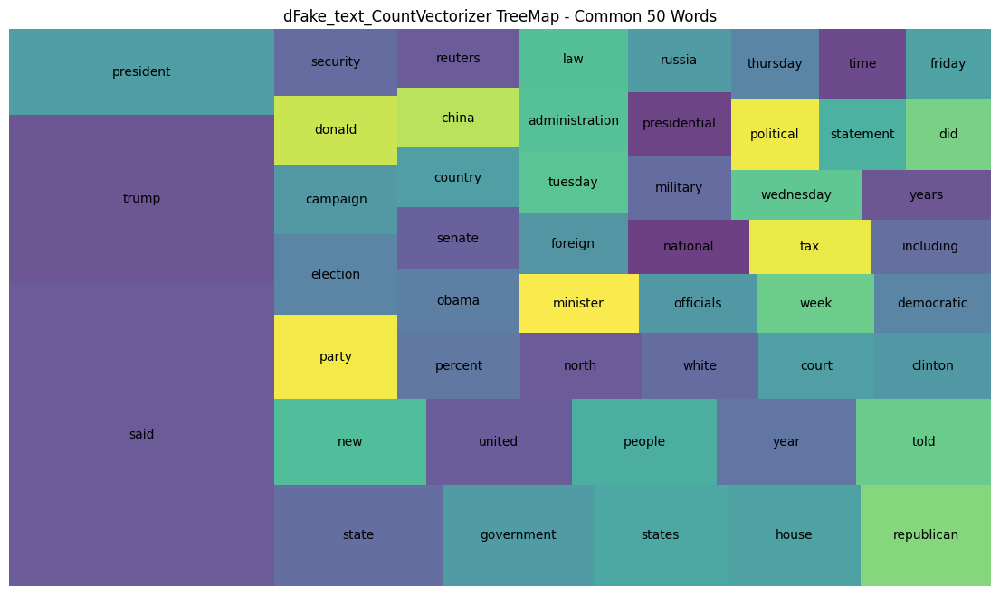

... CircularPacking ...


... FreqRadialBar ...


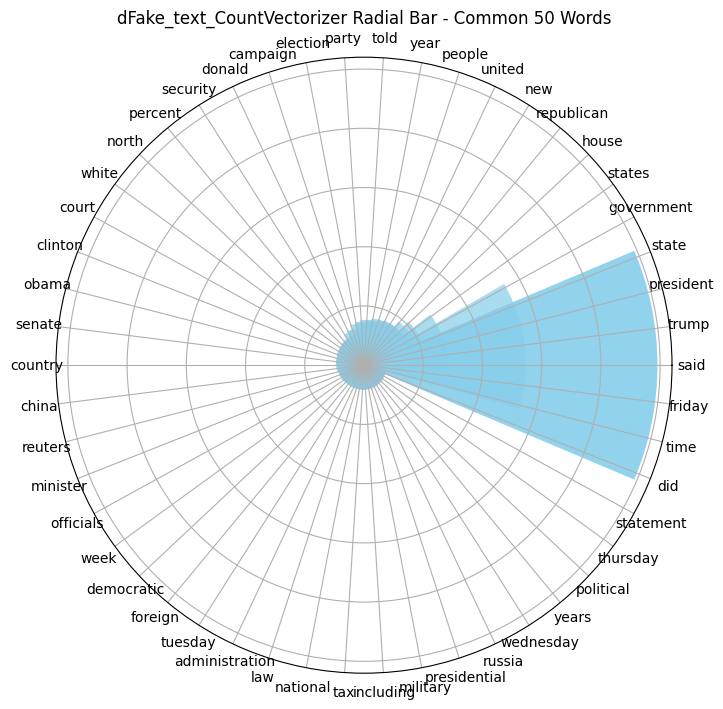

... WordCloud ...


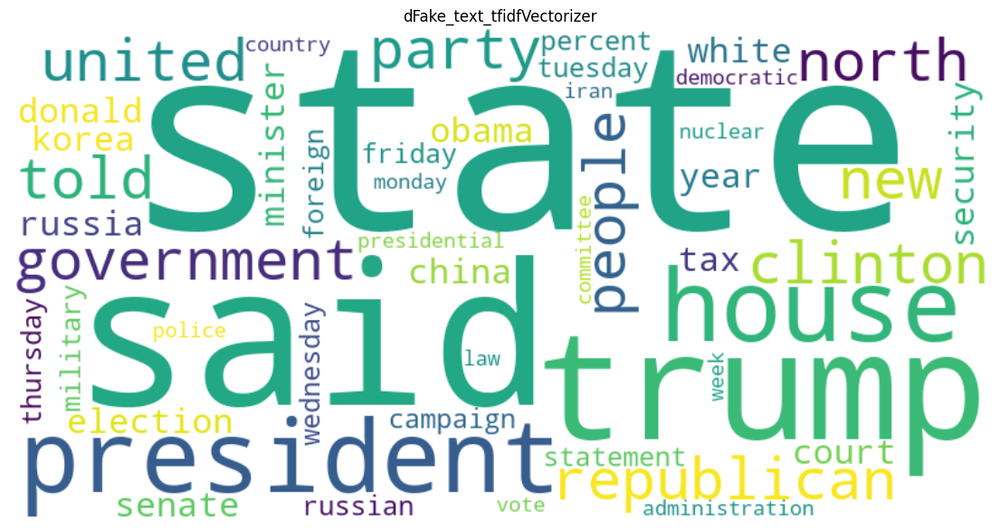

... FreqBar ...


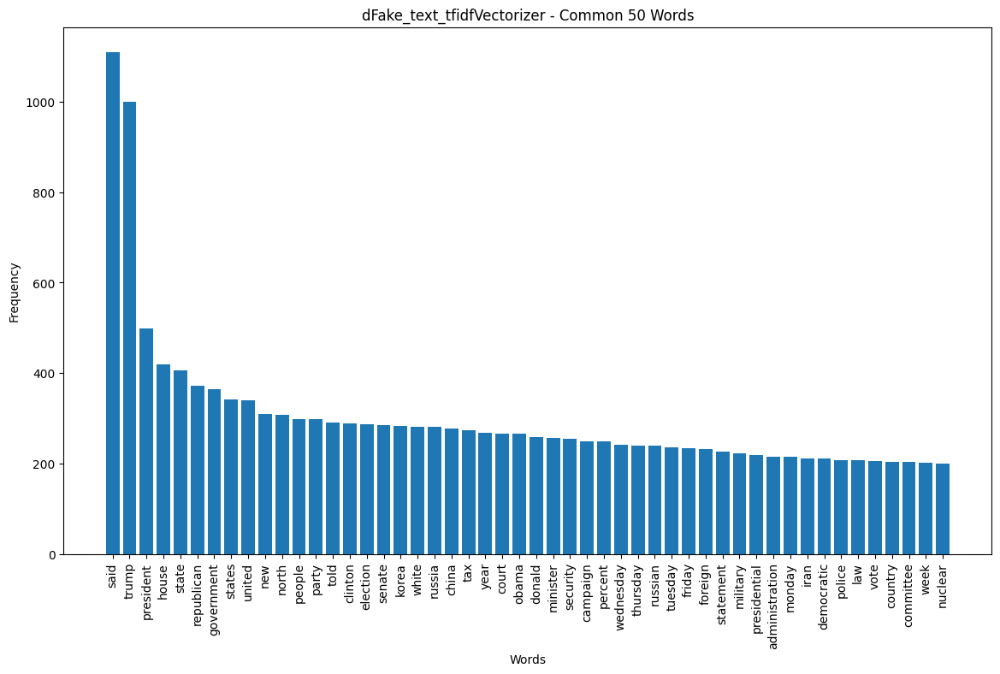

... FreqPie ...


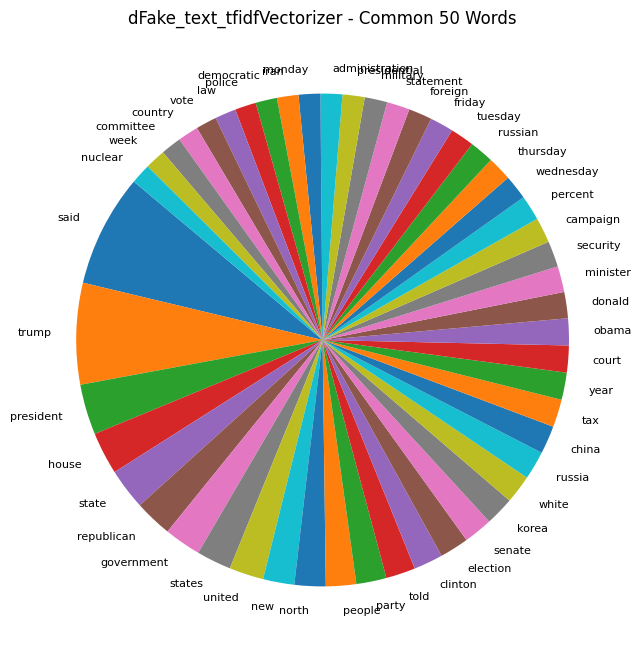

... Treemap ...


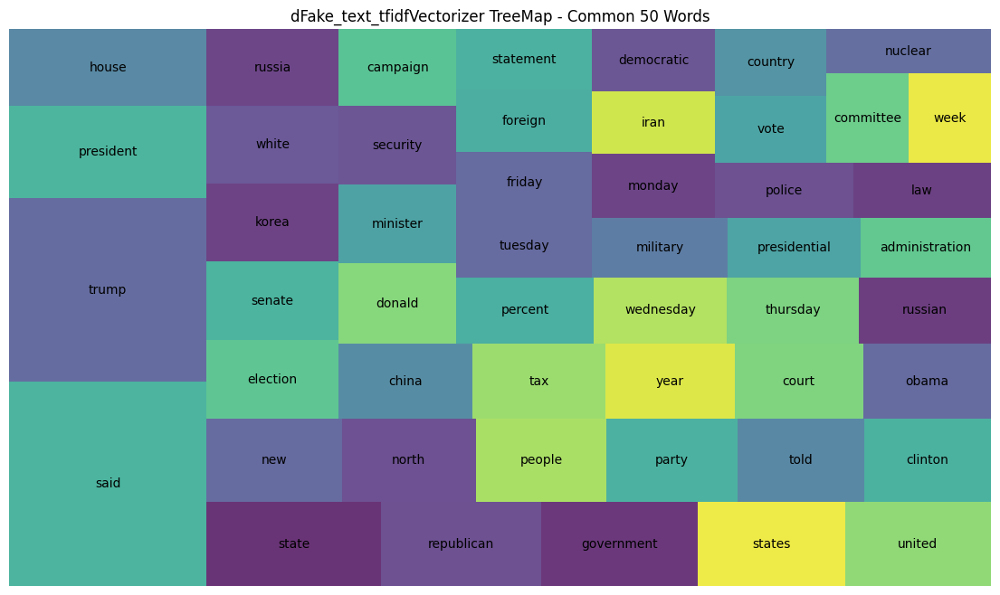

... CircularPacking ...


... FreqRadialBar ...


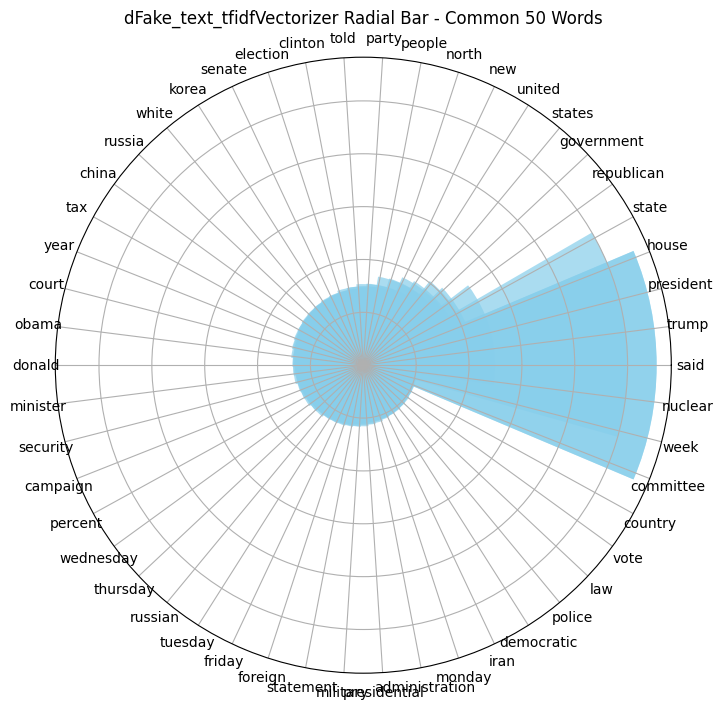

In [7]:
#####################################################################################
#  Functions for plotting tokenization and vectorization results                    #
#####################################################################################
import re
from nltk.corpus import stopwords
from nltk.tokenize import word_tokenize
from nltk.stem import PorterStemmer, WordNetLemmatizer
from sklearn.feature_extraction.text import CountVectorizer, TfidfVectorizer
from nltk import pos_tag
import nltk

from collections import Counter
from wordcloud import WordCloud

figsize = (14,8)
feature_col = 'text'
# Download stopwords if not already downloaded
nltk.download('stopwords')
nltk.download('punkt')
nltk.download('averaged_perceptron_tagger_eng')
nltk.download('wordnet')

def plot_wordFreqBar( common_words, tagname ):
    filename = tagname + "-Bar.jpg"
    words, counts = zip(*common_words)
    plt.figure(figsize=figsize)
    plt.bar(words, counts)
    plt.xticks(rotation=90)
    plt.title(f'{tagname}')
    plt.xlabel('Words')
    plt.ylabel('Frequency')
    plt.savefig( filename )
    plt.show()

def plot_wordFreqPie( common_words, tagname ):
    # Plot pie chart for the most common words
    filename = tagname + "-Pie.jpg"
    words, counts = zip(*common_words[:n_common_words])  # Top words for better visualization
    plt.figure(figsize=figsize)
    plt.pie(counts, labels=words, startangle=140,textprops={'fontsize': 8})
    plt.title(f'{tagname}')
    plt.savefig( filename )
    plt.show()

def plot_wordFreqTreemap( common_words, tagname ):    
    import squarify
    filename = tagname + "-Treemap.jpg"
    # Prepare data for treemap
    words, counts = zip(*common_words)
    sizes = [count for count in counts]

    # Plot treemap
    plt.figure(figsize=figsize)
    squarify.plot(sizes=sizes, label=words, alpha=0.8)
    plt.axis('off')
    plt.title(f'{tagname}')
    plt.savefig( filename )
    plt.show()

def plot_wordFreqCircularPacking( common_words, tagname ):
    filename = tagname + '-CircularPacking.jpg'
    import plotly.express as px
    # Prepare data for circular packing
    df_common_words = pd.DataFrame(common_words, columns=['word', 'count'])
    n_words = len(df_common_words['word'])
    # Plot circular packing
    fig = px.treemap(df_common_words, path=['word'], values='count', title=f'{tagname}')
    fig.update_traces(marker=dict(colorscale='Blues'))
##    fig.write_image( filename )
    fig.show()

def plot_wordFreqRadialBar( common_words, tagname ):
    # Prepare data for radial bar chart
    filename = tagname + '-RadialBar.jpg'    
    words, counts = zip(*common_words)
    angles = np.linspace(0, 2 * np.pi, len(words), endpoint=False).tolist()
    counts += counts[:1]
    angles += angles[:1]

    # Plot radial bar chart
    fig, ax = plt.subplots(figsize=figsize, subplot_kw=dict(polar=True))
    ax.bar(angles, counts, color='skyblue', alpha=0.7)
    ax.set_yticklabels([])
    ax.set_xticks(angles[:-1])
    ax.set_xticklabels(words, rotation=90)
    plt.title(f'{tagname}')
    plt.savefig( filename )
    plt.show()
  
def plot_WordCloud( common_words, tagname ):
    filename = tagname + '-WorldCloud.jpg'
    common_words_list = [ word for word,count in common_words ]
    all_words = ' '.join(common_words_list)
    wordcloud_ = WordCloud(width=800, height=400, background_color='white').generate(all_words)

    # Display the word cloud
    plt.figure(figsize=figsize)
    plt.imshow(wordcloud_, interpolation='bilinear')
    plt.axis('off')
    plt.title( tagname )
    plt.savefig( filename )
    plt.show()
    
def processWords( df, position_tags ):
    df[feature_col] = df[feature_col].apply(wordopt)            # Remove known artifacts from document
    all_text   = ' '.join(df[feature_col].astype(str))     # Stringize all words for tokenization
    words = word_tokenize(all_text)
    stop_words     = set(stopwords.words('english'))  # Remove stop words
    filtered_words = [word for word in words if word not in stop_words]
    pos_tags = pos_tag(filtered_words)                # Embed position tags to words
    # Remove/filter words that are not in the targeted position tags
    filtered_words = [word for word, tag in pos_tags if tag in position_tags]
    stemmer    = PorterStemmer()
    lemmatizer = WordNetLemmatizer()

    stemmed_words    = [stemmer.stem(word) for word in filtered_words]
    lemmatized_words = [lemmatizer.lemmatize(word) for word in stemmed_words]

    return df, lemmatized_words

def do_WordVectorizer( df, vectorizer_model, tagname ):
    vectorizer = vectorizer_model(stop_words='english')
    X = vectorizer.fit_transform(df[ feature_col ])

    # Sum up the counts of each vocabulary word
    word_counts_vectorizer = X.sum(axis=0).A1
    vocab = vectorizer.get_feature_names_out()
    word_freq = dict(zip(vocab, word_counts_vectorizer))

    # Get the 100 most common words using CountVectorizer
    common_words_vectorizer = Counter(word_freq).most_common( n_common_words )
    print(f'... WordCloud ...')
    plot_WordCloud( common_words_vectorizer, f'{tagname}')
    print(f'... FreqBar ...')
    plot_wordFreqBar( common_words_vectorizer, f'{tagname} - Common {n_common_words} Words' )
    print(f'... FreqPie ...')
    plot_wordFreqPie( common_words_vectorizer, f'{tagname} - Common {n_common_words} Words' )
    print(f'... Treemap ...')
    plot_wordFreqTreemap( common_words_vectorizer, f'{tagname} TreeMap - Common {n_common_words} Words' )
    print(f'... CircularPacking ...')
    plot_wordFreqCircularPacking( common_words_vectorizer, f'{tagname} Circular Packing - Common {n_common_words} Words' )
    print(f'... FreqRadialBar ...')
    plot_wordFreqRadialBar( common_words_vectorizer, f'{tagname} Radial Bar - Common {n_common_words} Words' )

def do_WordEDA( df, important_pos_tags, tagname_, feature ):
    feature_col = feature
    tagname = tagname_ + '_' + feature_col
    df, lemmatized_words = processWords( df, important_pos_tags )

    # Count the frequency of each word
    word_counts  = Counter(lemmatized_words)
    common_words = word_counts.most_common( n_common_words )
    plot_WordCloud  ( common_words, f'{tagname}_Count' )        # plot wordCloud
    plot_wordFreqBar( common_words, f'{tagname}_Count' )                    # plot wordFreq Bar

    do_WordVectorizer( data_true, CountVectorizer, f'{tagname}_CountVectorizer' )  # Count/BagOfWord Vectorizer
    do_WordVectorizer( data_true, TfidfVectorizer, f'{tagname}_tfidfVectorizer' )  # tfidf Vectorizer   

important_pos_tags = {'NN', 'NNS', 'NNP', 'NNPS', 'VB', 'VBD', 'VBG', 'VBN', 'VBP', 'VBZ'}
do_WordEDA( data_true, important_pos_tags, 'dTrue','title')
do_WordEDA( data_fake, important_pos_tags, 'dFake','title')

do_WordEDA( data_true, important_pos_tags, 'dTrue','text')
do_WordEDA( data_fake, important_pos_tags, 'dFake','text')


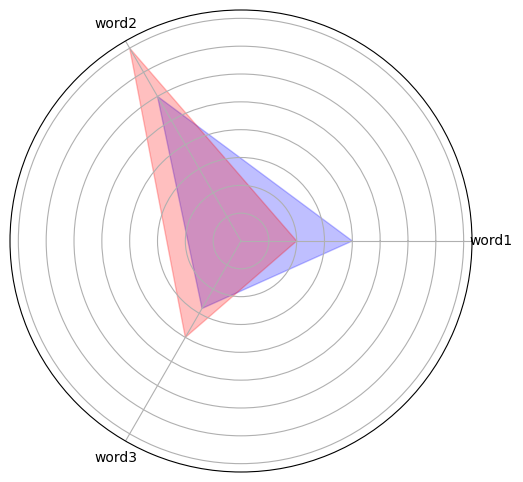

In [8]:
import numpy as np
import matplotlib.pyplot as plt

# Example data
words_set1 = {'word1': 10, 'word2': 15, 'word3': 7}
words_set2 = {'word1': 5, 'word2': 20, 'word3': 10}

labels = list(words_set1.keys())
values1 = list(words_set1.values())
values2 = list(words_set2.values())

# Number of variables
num_vars = len(labels)

# Compute angle for each bar
angles = np.linspace(0, 2 * np.pi, num_vars, endpoint=False).tolist()

# The plot is circular, so we need to "complete the loop"
values1 += values1[:1]
values2 += values2[:1]
angles += angles[:1]

fig, ax = plt.subplots(figsize=(6, 6), subplot_kw=dict(polar=True))

ax.fill(angles, values1, color='blue', alpha=0.25)
ax.fill(angles, values2, color='red', alpha=0.25)

ax.set_yticklabels([])
ax.set_xticks(angles[:-1])
ax.set_xticklabels(labels)

plt.show()
